# Laboratorio 1 - Deteccion de Phishing
## Universidad del Valle de Guatemala
## Security Data Science
#### Integrantes:
- Pedro Arriola
- Andrés de la Roca

In [49]:
import pandas as pd
import numpy as np
import re
from collections import Counter
from sklearn import feature_extraction, tree, model_selection, metrics
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
%matplotlib inline
from yellowbrick.features import Rank2D
from yellowbrick.features import RadViz

### Parte 1 - Ingenieria de Caracteristicas

#### Exploracion de datos

In [50]:
df = pd.read_csv('dataset_pishing.csv')
print(df.shape)

# Samples de dominios del dataset (Legitimate)
df[df.status == 'legitimate'].sample(5)



(11430, 2)


,url,status
2073,http://www.cpf.navy.mil/,legitimate
255,https://www.weightworld.se/,legitimate
8301,https://www.bodybuilding.com/fun/20-best-healt...,legitimate
5381,http://www.cat5ecableguy.com/questions_about_c...,legitimate
6503,http://www.khaldea.com/rudhyar/astroarticles/i...,legitimate


In [51]:
# Samples de dominios del dataset (Phishing)
df[df.status == 'phishing'].sample(5)

,url,status
10242,http://www.wpischedbend.pifighter.com/points.p...,phishing
6725,http://www.page-business.facebook.item87235278...,phishing
2219,http://www.didaktikelectronic.sk/sitemap/02/po...,phishing
7581,https://tyy756dfxas.appspot.com/,phishing
6650,https://englishstudio.ir/layout,phishing


#### Derivacion de caracteristicas (Features)

<b>Listado de caracteristicas elegidas</b>

1. Longitud de la URL
2. Cantidad de digitos en la URL
3. Entropia (Shannon) de la URL
4. Entropia (Relativa) de la URL
5. Proporcion entre vocales y consonantes
6. Posicion del primer digito en la URL
7. Presencia de direccion IP en la URL
8. Caracteres especiales en la URL
9. Presencia de puertos en la URL
10. Cantidad de subdominios
11. Cantidad de terminos comunes en URL (www, .com, http, https, etc)
12. Presencia de guiones bajos en la URL
13. Presencia de guiones en la URL
14. URL acortada
15. Subdominios abnormales

In [52]:
from six.moves import cPickle as pickle

with open('d_common_en_words' + '.pickle', 'rb') as f:
    d = pickle.load(f)

def entropyShanon (x):
    # Calculate Shannon Entropy
    prob = [ float(x.count(c)) / len(x) for c in dict.fromkeys(list(x)) ] 
    H = - sum([ p * np.log2(p) for p in prob ]) 
    return H

def firstDigitIndex( s ):
    for i, c in enumerate(s):
        if c.isdigit():
            return i + 1
    return 0

def vowel_consonant_ratio (x):
    # Calculate vowel to consonant ratio
    x = x.lower()
    vowels_pattern = re.compile('([aeiou])')
    consonants_pattern = re.compile('([b-df-hj-np-tv-z])')
    vowels = re.findall(vowels_pattern, x)
    consonants = re.findall(consonants_pattern, x)
    try:
        ratio = len(vowels) / len(consonants)
    except: # catch zero devision exception 
        ratio = 0  
    return ratio

# ngrams: Implementation according to Schiavoni 2014: "Phoenix: DGA-based Botnet Tracking and Intelligence"
# http://s2lab.isg.rhul.ac.uk/papers/files/dimva2014.pdf

def ngrams(word, n):
    # Extract all ngrams and return a regular Python list
    # Input word: can be a simple string or a list of strings
    # Input n: Can be one integer or a list of integers 
    # if you want to extract multipe ngrams and have them all in one list
    
    l_ngrams = []
    if isinstance(word, list):
        for w in word:
            if isinstance(n, list):
                for curr_n in n:
                    ngrams = [w[i:i+curr_n] for i in range(0,len(w)-curr_n+1)]
                    l_ngrams.extend(ngrams)
            else:
                ngrams = [w[i:i+n] for i in range(0,len(w)-n+1)]
                l_ngrams.extend(ngrams)
    else:
        if isinstance(n, list):
            for curr_n in n:
                ngrams = [word[i:i+curr_n] for i in range(0,len(word)-curr_n+1)]
                l_ngrams.extend(ngrams)
        else:
            ngrams = [word[i:i+n] for i in range(0,len(word)-n+1)]
            l_ngrams.extend(ngrams)
#     print(l_ngrams)
    return l_ngrams

def ngram_feature(domain, d, n):
    # Input is your domain string or list of domain strings
    # a dictionary object d that contains the count for most common english words
    # finally you n either as int list or simple int defining the ngram length
    
    # Core magic: Looks up domain ngrams in english dictionary ngrams and sums up the 
    # respective english dictionary counts for the respective domain ngram
    # sum is normalized
    
    l_ngrams = ngrams(domain, n)
#     print(l_ngrams)
    count_sum=0
    for ngram in l_ngrams:
        if d[ngram]:
            count_sum+=d[ngram]
    try:
        feature = count_sum/(len(domain)-n+1)
    except:
        feature = 0
    return feature
    
def average_ngram_feature(l_ngram_feature):
    # input is a list of calls to ngram_feature(domain, d, n)
    # usually you would use various n values, like 1,2,3...
    return sum(l_ngram_feature)/len(l_ngram_feature)

#Copiado de https://redcanary.com/blog/threat-hunting-entropy/
def relative_entropy(data):
    # Remove TLDs and instances of 'www' so 'www.google.com' would be treated as 'google' and 'images.google.com' would be 'images.google'.
    data = data.replace('www.', '')
    # Remove http:// and https://.
    data = data.split('://')[-1]
    # Remove subdomains.
    data = data.split('.')[0]

    data = data.lower()    

    # print(data)
    #Calculate the relative entropy (Kullback-Leibler divergence) between data and expected values.
    entropy = 0.0
    length = len(data) * 1.0

    if length > 0:
        cnt = Counter(data)
            
        # These probability numbers were calculated from the Alexa Top
        # 1 million domains as of September 15th, 2017. TLDs and instances
        # of 'www' were removed so 'www.google.com' would be treated as
        # 'google' and 'images.google.com' would be 'images.google'.
        probabilities = {
            '-': 0.013342298553905901,
            '_': 9.04562613824129e-06,
            '0': 0.0024875471880163543,
            '1': 0.004884638114650296,
            '2': 0.004373560237839663,
            '3': 0.0021136613076357144,
            '4': 0.001625197496170685,
            '5': 0.0013070929769758662,
            '6': 0.0014880054997406921,
            '7': 0.001471421851820583,
            '8': 0.0012663876593537805,
            '9': 0.0010327089841158806,
            'a': 0.07333590631143488,
            'b': 0.04293204925644953,
            'c': 0.027385633133525503,
            'd': 0.02769469202658208,
            'e': 0.07086192756262588,
            'f': 0.01249653250998034,
            'g': 0.038516276096631406,
            'h': 0.024017645001386995,
            'i': 0.060447396668797414,
            'j': 0.007082725266242929,
            'k': 0.01659570875496002,
            'l': 0.05815885325582237,
            'm': 0.033884915513851865,
            'n': 0.04753175014774523,
            'o': 0.09413783122067709,
            'p': 0.042555148167356144,
            'q': 0.0017231917793349655,
            'r': 0.06460084667060655,
            's': 0.07214640647425614,
            't': 0.06447722311338391,
            'u': 0.034792493336388744,
            'v': 0.011637198026847418,
            'w': 0.013318176884203925,
            'x': 0.003170491961453572,
            'y': 0.016381628936354975,
            'z': 0.004715786426736459
        }
            
        for char, count in cnt.items():
            observed = count / length
            expected = probabilities[char]
            entropy += observed * np.log2(observed / expected)
            
        return entropy

In [53]:
# Presencia de direccion IP en la URL
def ip_address_presence (x):
    # Check for IP address in URL
    ip_pattern = re.compile('((25[0-5]|2[0-4][0-9]|[01]?[0-9][0-9]?)\.){3}(25[0-5]|2[0-4][0-9]|[01]?[0-9][0-9]?)')
    if re.search(ip_pattern, x):
        return 1
    else:
        return 0
    

# Caracteres especiales en la URL
def special_chars_presence (x):
    # Check for special characters in URL
    special_chars_pattern = re.compile('([%$&+,:;=?@#|])')
    if re.search(special_chars_pattern, x):
        return 1
    else:
        return 0
    
# Presencia de puertos en la URL
def port_presence (x):
    # Check for port in URL
    port_pattern = re.compile('(:[0-9]+)')
    if re.search(port_pattern, x):
        return 1
    else:
        return 0
    
# Cantidad de subdominios en la URL
def subdomain_count (x):
    # Count subdomains
    subdomains = x.split('.')
    return len(subdomains)

# Cantidad de terminos comunes en la URL (www, com, net, org, etc)

def common_terms_count (x):
    # Count common terms
    common_terms = ['www', 'com', 'net', 'org', 'info', 'biz', 'us', 'uk', 'ca', 'de', 'jp', 'fr', 'au', 'in', 'it', 'cn', 'gov', 'https', 'http', '//']
    count = 0
    for term in common_terms:
        if term in x:
            count += 1
    return count

# Presencia de guiones en la URL
def hyphen_presence (x):
    # Check for hyphens in URL
    hyphen_pattern = re.compile('(-)')
    if re.search(hyphen_pattern, x):
        return 1
    else:
        return 0
    
# Presencia de doble guion bajo en la URL
def double_hyphen_presence (x):
    # Check for double hyphens in URL
    double_hyphen_pattern = re.compile('(__)')
    if re.search(double_hyphen_pattern, x):
        return 1
    else:
        return 0
    
# URL Acortada
def shortening_service_presence (x):
    # Check for shortening service in URL
    shortening_services = ['bit.ly', 'goo.gl', 'tinyurl.com', 'ow.ly', 't.co', 'tiny.cc', 'bit.do', 'mcaf.ee', 'cli.gs', 'yfrog.com', 'twit.ac', 'su.pr', 'lnkd.in', 'db.tt', 'qr.ae', 'adf.ly', 'goo.gl', 'bitly.com', 'cur.lv', 'tiny.cl', 'po.st', 'bc.vc', 'twitthis.com', 'u.to', 'j.mp', 'buzurl.com', 'cutt.us', 'u.bb', 'yourls.org', 'x.co', 'prettylinkpro.com', 'scrnch.me', 'filoops.info', 'vzturl.com', 'qr.net', '1url.com', 'tweez.me', 'v.gd', 'tr.im', 'link.zip.net']
    for service in shortening_services:
        if service in x:
            return 1
    return 0

# Subdominios abnormales
def abnormal_subdomain_presence (x):
    # Check for abnormal subdomains
    abnormal_subdomains = ['sc', 'dc', 'oc', 'ac', 'info', 'mail', 'home', 'corp', 'download', 'product', 'support', 'payment', 'login', 'secure', 'account', 'admin', 'administrator', 'root', 'blog', 'blogspot', 'wordpress', 'web', 'webs', 'website', 'net', 'org', 'in', 'co', 'cc', 'biz', 'info', 'name', 'pro', 'tel', 'mobi', 'aero', 'asia', 'cat', 'coop', 'jobs', 'museum', 'travel', 'arpa', 'root', 'local', 'onion', 'example', 'invalid', 'test', 'localhost', 'localdomain', 'local']
    for subdomain in x.split('.'):
        if subdomain in abnormal_subdomains:
            return 1
    return 0

In [54]:
df['ngrams'] = df['url'].apply(lambda x: average_ngram_feature([ngram_feature(x, d, 1), 
                                                                ngram_feature(x, d, 2), 
                                                                ngram_feature(x, d, 3)]))

# check final 2D pandas DataFrame containing all final features and the target vector isDGA
df.sample(10)
df['entropy'] = df['url'].apply(entropyShanon)
df['entropyRelative'] = df['url'].apply(relative_entropy)
df['vowel-cons'] = df['url'].apply(vowel_consonant_ratio)
df['firstDigitIndex'] = df['url'].apply(firstDigitIndex)
df['length'] = df['url'].str.len()
df['digits'] = df['url'].str.count('[0-9]')

#Ip address presence
df['ip'] = df['url'].apply(ip_address_presence)
#Special characters presence
df['special'] = df['url'].apply(special_chars_presence)
#Port presence
df['port'] = df['url'].apply(port_presence)
#Subdomain count
df['subdomain'] = df['url'].apply(subdomain_count)
#Common terms count
df['common'] = df['url'].apply(common_terms_count)
#Hyphen presence
df['hyphen'] = df['url'].apply(hyphen_presence)
#Double hyphen presence
df['doubleHyphen'] = df['url'].apply(double_hyphen_presence)
#Shortening service presence
df['shortening'] = df['url'].apply(shortening_service_presence)
#Abnormal subdomain presence
df['abnormal'] = df['url'].apply(abnormal_subdomain_presence)

# Codificar la variable objetivo
df['status'] = df['status'].replace(to_replace=['legitimate', 'phishing'], value=[0, 1])
print(df["status"].value_counts())
df.sample(n=5).head()

0    5715
1    5715
Name: status, dtype: int64


,url,status,ngrams,entropy,entropyRelative,vowel-cons,firstDigitIndex,length,digits,ip,special,port,subdomain,common,hyphen,doubleHyphen,shortening,abnormal
221,http://justlookapp.com/blog/wp-content/themes/...,1,939.200079,4.585580,1.399478,0.372549,72,102,20,0,1,0,2,5,1,0,0,0
7866,https://support-appleld.com.secureupdate.duila...,1,843.722987,4.855993,1.117812,0.537037,63,128,26,0,1,0,5,5,1,0,0,0
205,http://energo-investment.hu,0,1287.452289,3.838040,1.122087,0.466667,0,27,0,0,1,0,2,3,1,0,0,0
8628,https://security.stackexchange.com/questions/5...,0,1211.623182,4.447875,1.441827,0.582090,46,129,4,0,1,0,3,5,1,0,0,0
9079,http://meetme.run/3m8TS,1,868.083380,3.696625,2.737190,0.333333,19,23,2,0,1,0,2,2,0,0,0,0


#### Preprocesamiento

In [55]:
df_features = df.drop(['url'], axis=1)
df_features.to_csv('dataset_phishing_features.csv', index=False)
df_features.head()

,status,ngrams,entropy,entropyRelative,vowel-cons,firstDigitIndex,length,digits,ip,special,port,subdomain,common,hyphen,doubleHyphen,shortening,abnormal
0,0,1021.596811,3.787043,1.221603,0.363636,0,37,0,0,1,0,4,4,0,0,0,0
1,1,1043.370276,4.419864,0.792675,0.827586,33,77,17,0,1,0,2,4,0,0,0,0
2,1,898.074986,4.753412,1.117812,0.517241,63,126,19,0,1,0,5,5,1,0,0,0
3,0,979.667484,3.461320,1.919763,0.300000,0,18,0,0,1,0,3,3,0,0,0,1
4,0,1079.680355,4.097662,1.778614,0.363636,0,55,0,0,1,0,3,5,1,0,0,0


#### Visualizacion de resultados (Pandas profiling)

In [56]:
import pandas_profiling

# Generate the profile report
profile = df_features.profile_report(title="Data Profile")

# Save the report as an HTML file
profile.to_file("data_profile.html")

# Display the report
profile


C:\Users\Andre\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\numba\core\decorators.py:262: NumbaDeprecationWarning: numba.generated_jit is deprecated. Please see the documentation at: https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-generated-jit for more information and advice on a suitable replacement.
  warnings.warn(msg, NumbaDeprecationWarning)
C:\Users\Andre\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\visions\backends\shared\nan_handling.py:51: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for de

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

C:\Users\Andre\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\multimethod\__init__.py:315: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  return func(*args, **kwargs)


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [57]:
feature_names = df_features.columns.tolist()
features = df_features[feature_names].values
target = df['status'].values

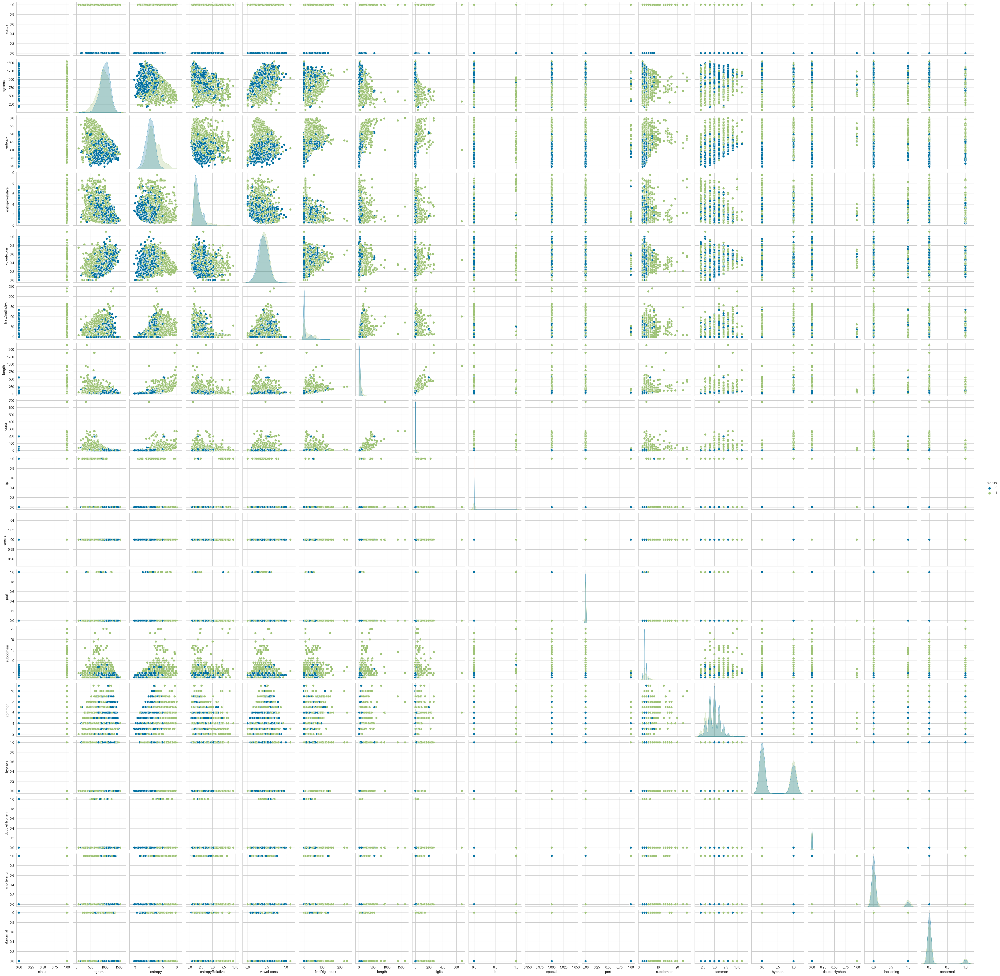

In [58]:
# sns.pairplot(df_features, hue='status', vars=feature_names)

In [59]:
df_features.drop(['hyphen', 'doubleHyphen', 'common'], axis=1, inplace=True)

In [60]:
df_features.head()

,status,ngrams,entropy,entropyRelative,vowel-cons,firstDigitIndex,length,digits,ip,special,port,subdomain,shortening,abnormal
0,0,1021.596811,3.787043,1.221603,0.363636,0,37,0,0,1,0,4,0,0
1,1,1043.370276,4.419864,0.792675,0.827586,33,77,17,0,1,0,2,0,0
2,1,898.074986,4.753412,1.117812,0.517241,63,126,19,0,1,0,5,0,0
3,0,979.667484,3.461320,1.919763,0.300000,0,18,0,0,1,0,3,0,1
4,0,1079.680355,4.097662,1.778614,0.363636,0,55,0,0,1,0,3,0,0


In [ ]:
df_features.to_csv('dataset_phishing_features.csv', index=False)

### Parte 2 - Implementacion